# Security People Network

Written by:

|Studie no.|Full Name           |
|:--------:|:------------------:|
| s192188  | Yucheng Ren         |
| s153753  | Søren Fritzbøger    |
| s143232  | Peter Bom Jakobsen  |

## Motivation

Security people - as the world of IT becomes more widespread and increasingly complex, many security vulnerabilities arise which could potentially have an enormous impact on a company or worse case a whole country. There are a few guardians who dedicate their life to secure the IT infrastructure so we all can sleep peacefully.

We want to explore how many security people there are and find out if they generally know each other. 
Find out if they can be split into two communities of offensive vs defensive security. 
Within these communities, we could try to use some Natural Language Processing to detect which community speaks most loudly and potentially see if there is a sentimentally difference.

Many security people uses Twitter as the communication platform to share their discoveries, insights and thoughts about security vulnerabilites and how to fix those.
Therefore, we will use the Twitter API to extract data about these people.

## Basic stats

The dataset is collected step by step. First, we collect the most recent tweets in the last seven days that are related to security topic. Then extract the author and mentions in the text as a start point, with these user information in hand, the next step is to retrieve the friends of them and gradually build the network. At each step, we use dictionary and set in Python to avoid duplicated records.

The overall size of our dataset is rougly 135 MB which contains 1988036 number of lines.

The dataset is a collection of many CSV files which is can be retrieved here:
[https://raw.githubusercontent.com/Glorforidor/SocialGraphAssignments/master/twitter_data.zip][1].

The dataset contains:

* Screen names.
* Tweets containing security words "infosec", "cve",  "cybersec", "cybersecurity" or "ransomware".
* Friends' ids and their screen names.
* Timeline tweets - 20 unfiltered tweets.
* User descriptions and locations.

Screen names is the Twitter handle of a user. This is unique for every user on Twitter.

From the network perspective, there are 2050 number of nodes and 18040 number of edges.

[1]: https://raw.githubusercontent.com/Glorforidor/SocialGraphAssignments/master/twitter_data.zip

## Tools, theory and analysis

All the code for extracting data and creating our graph is located in [https://nbviewer.jupyter.org/github/Glorforidor/SocialGraphAssignments/blob/master/twitter_scrapper.ipynb][1]. It is split into sections each representing a phase of extracting and working with data.

The sections are:

* Twitter scraping
    - Broad extraction of Twitter users that have tweeted about security and their friends.
* Graph creation
    - Creating the Security People Network from the extracted Twitter data.
* Community creation
    - Calculate and create communities from the network.
* Community member information
    - Extract Twitter information such as description and location from members (Twitter profiles) in the communities.
* Sentiment data
    - Extract general tweets from community members.


The following sections will use the data acquired from the twitter_scrapper.ipynb, for visualization and analysis.

[1]: https://nbviewer.jupyter.org/github/Glorforidor/SocialGraphAssignments/blob/master/twitter_scrapper.ipynb

In [1]:
# Standard libraries.
import collections
import csv
from functools import wraps
import math
import os
import os.path

# Third party libraries.
from fa2 import ForceAtlas2
import networkx as nx
import nltk
from nltk import word_tokenize
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import texttable
from wordcloud import WordCloud

In [2]:
# Filenames of all the data files which makes up our dataset.
tweets_filename = "tweets.csv"
id_to_screen_name_filename = "id_to_screen_name.csv"
user_and_friends_filename = "user_and_friends_ids.csv"
user_to_friend_filename = "user_to_friend_screen_names.csv"
bios_filename = "bios.csv"
sentiment_tweets_filename = "sentiment_tweets.csv"
communities_filename = "communities.csv"
top_5_communities_filename = "top_5_communities.csv"

# The saved graph - it is an undirected graph.
graph_filename = "security_network.gml"

### Step 1 - Data gathering

As our project revolves around security people on Twitter, the first natural step was to scrape twitter for tweets regarding cyber security. To extract data from Twitter one needs a Twitter developer account.
The process of applying for a developer account was a bit tedious, so we rooted against that and used an existing personal app the team member Peter Bom Jakobsen already had in place.
With this in place we could begin extracting data.

For data extraction we used the Python library [Tweepy][1], which wraps the Twitter API for easy usage. 
The library parses the JSON output of Twitter API into objects, which made it a lot easier to get the information we needed from the Twitter.

The dataset was built from an initial list of 3546 recent tweets acquired using the following search query:

```
(infosec OR cve OR cybersec OR cybersecurity OR ransomware) -filter:retweets min_faves:10
```

ie. searching for original tweets containing the selected keywords and a minimum of ten likes. The tweets were then scraped for twitter usernames by using the simple regular expression `@\w+` to find mentions (denoted by a "@" followed by a screen name).
From this initial list of security people on twitter, we once again used Tweepy to find their friends within this Twitter sphere.

Further on in the project, the biography's and location's of these security people were gathered to examine the existence of communities within this Twitter sphere. A list of the 20 most recent tweets were also gathered for our tweeters to examine the sentiment of communities.

### Step 2 - Creating a network

In the data gathering state, we used Tweepy to gather a list of security persons on twitter and their friends within the gathered Twitter sphere. As an example we can describe person two persons $A,B$ where we have the following relations

1. $A$ <-> $B$ ie $A$ follows $B$ and $B$ follows $A$.
2. $A$ -> $B$ ie $A$ follows $B$ whereas $B$ does not follow $A$.
3. $A$ <- $B$ ie $B$ follows $A$ whereas $A$ does not follow $B$.

In these three instances only (1) is classified as a friendship meaning both $A$ and $B$ follow each other. In (2) and (3) no friends exist.

This definition is important for the way we construct our graph. As a friend is only valid if both $A$ and $B$ follows each other (1), we can construct our graph as a undirected graph, where our twitter people are our nodes and their friends are edges.

This is done using the NetworkX graph method.

In [3]:
g = nx.read_gml(graph_filename)

In [4]:
# Get node sizes. These will be used to make a better node representation on plots.
node_sizes = [d for __, d in g.degree]

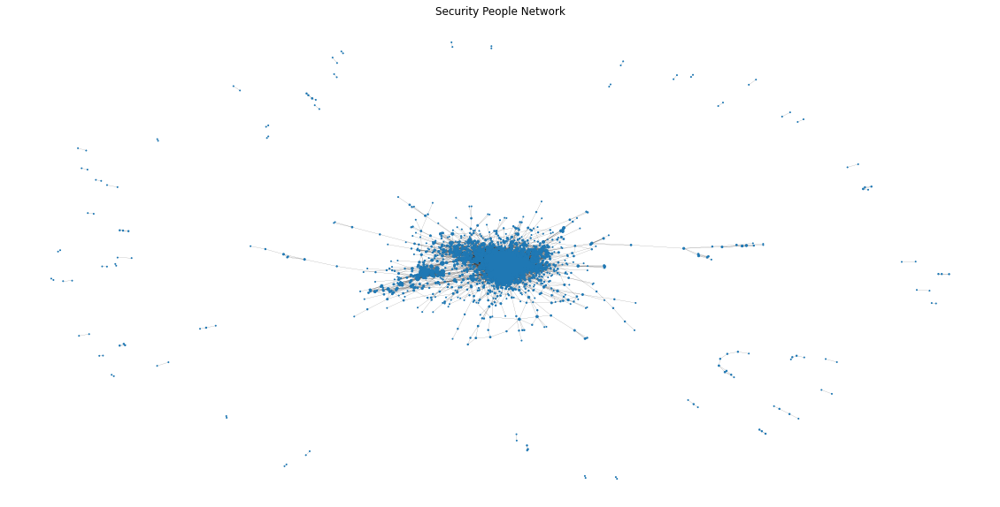

In [5]:
# Plot the security people network. 
fig = plt.figure(figsize=(20, 10))
nx.draw_networkx(g, node_size=node_sizes, with_labels=False, width=0.1)
plt.title("Security People Network")
plt.axis('off')
fig.show()

In [6]:
# Create an ForceAtlas2 instance which is then used better position nodes. 
# This will make graphs visually more pleasingly.
forceatlas2 = ForceAtlas2(# Behavior alternatives
                          outboundAttractionDistribution=True,  # Dissuade hubs
                          edgeWeightInfluence=0.5,
                          # Performance
                          jitterTolerance=0.2, # Tolerance
                          barnesHutOptimize=True,
                          barnesHutTheta=0.6,
                          # Tuning
                          scalingRatio=0.0,
                          strongGravityMode=False,
                          gravity=1,
                          # Log
                          verbose=True)

positions = forceatlas2.forceatlas2_networkx_layout(g, pos=None, iterations=2000)

100%|██████████| 2000/2000 [02:48<00:00, 11.87it/s]BarnesHut Approximation  took  53.58  seconds
Repulsion forces  took  106.71  seconds
Gravitational forces  took  0.46  seconds
Attraction forces  took  2.92  seconds
AdjustSpeedAndApplyForces step  took  1.31  seconds



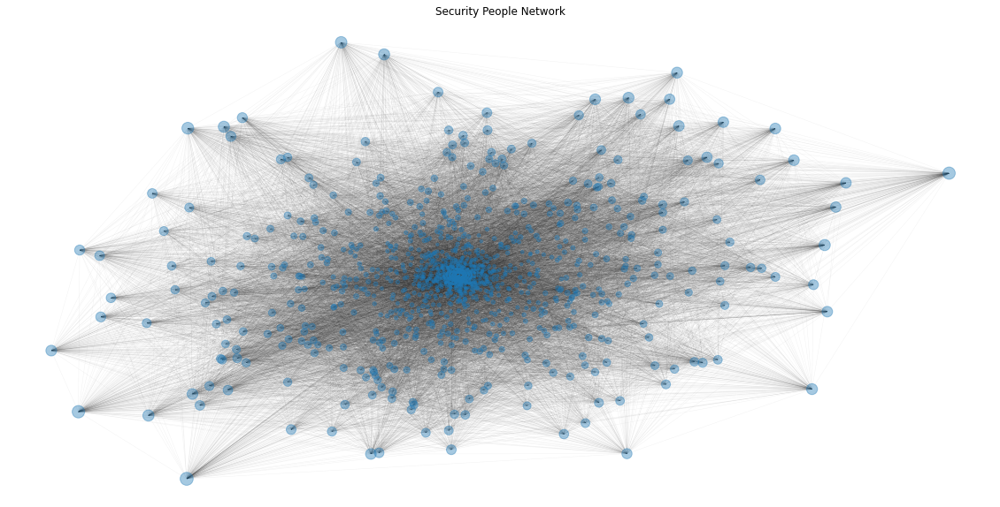

In [7]:
# Plot the Security People Network using the Force Atlas algorithm.
fig = plt.figure(figsize=(20, 10))
nx.draw_networkx_nodes(g, positions, node_size=node_sizes, alpha=0.4)
nx.draw_networkx_edges(g, positions, edge_color="black", alpha=0.05, width=0.5)
plt.title("Security People Network")
plt.axis('off')
fig.show()

As it can be seen, the graph is very compact and does not give a very good overview of the network. Therefore we apply the Force Atlas 2 layout algorithm to create a more visually pleasing graph[1]:

Our undirected graph contains a total of `2050` nodes (ie. security people) and `18040` edges (ie friendships)
As it can be seen on the graph, there seems to be a clustering of high-edge nodes in the middle of the graph.

This can be confirmed by looking at the following histogram where we can clearly see that the distribution of friends follows the power law distribution.

In [8]:
print("Security People Network", f"Nodes: {g.number_of_nodes()}", f"Edges: {g.number_of_edges()}", sep="\n")

Security People Network
Nodes: 2050
Edges: 18040


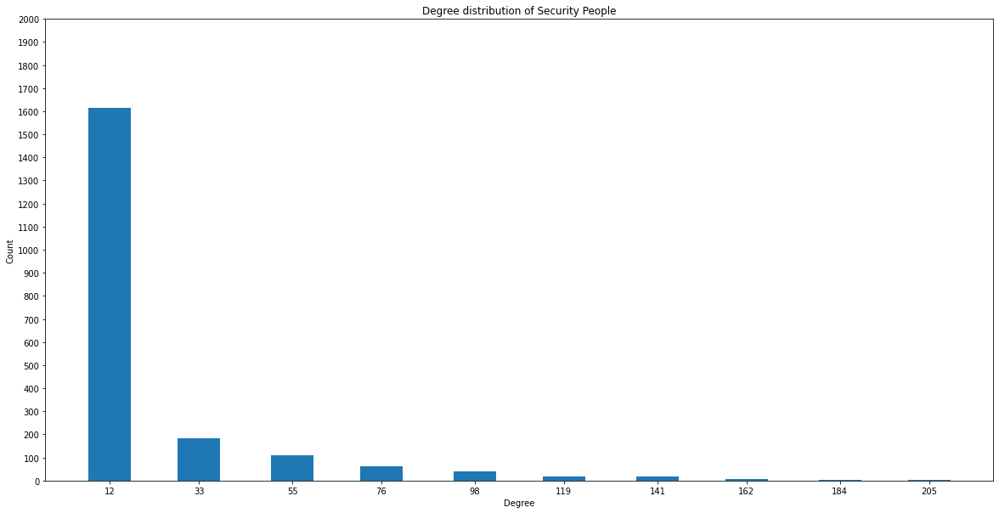

In [9]:
# Plot the degree distribution.
hist, bin_edges = np.histogram([degree for __, degree in g.degree])
center = ((bin_edges[:-1] + bin_edges[1:]) / 2).round()
fig = plt.figure(figsize=(20, 10))
plt.bar(center, hist, width=10)
plt.title("Degree distribution of Security People")
plt.ylabel("Count")
plt.xlabel("Degree")
plt.xticks(center)
plt.yticks(list(range(0, len(g.degree), 100)))
fig.show()

Looking at the 10 twitter profiles with the most friends we can see some known people within security on Twitter:

In [10]:
# The top 10 Twitter profiles with most friends - in network term highest degree.
table = texttable.Texttable()
table.set_cols_align(["l", "r"])
table.set_cols_valign(["t", "b"])
table.add_row(["Name", "Friends"])

for screen_name, degree in sorted(g.degree, key=lambda x: x[1], reverse=True)[:10]:
    table.add_row([screen_name, degree])

print(table.draw())

+------------------+---------+
| Name             | Friends |
+------------------+---------+
| @HackingDave     |     216 |
+------------------+---------+
| @AlyssaM_InfoSec |     198 |
+------------------+---------+
| @RayRedacted     |     193 |
+------------------+---------+
| @NicoleBeckwith  |     178 |
+------------------+---------+
| @DfirDiva        |     170 |
+------------------+---------+
| @sherrod_im      |     161 |
+------------------+---------+
| @cybergeekgirl   |     161 |
+------------------+---------+
| @gabsmashh       |     160 |
+------------------+---------+
| @LisaForteUK     |     158 |
+------------------+---------+
| @UK_Daniel_Card  |     154 |
+------------------+---------+


As an example we can see **@HackingDave** who is the founder and CEO of the well known cyber security company TrustedSec[2] within the United States. The rest of the list are also security people who are known for tweeting about cyber security.

This confirms our theory that people who tweet about security know each other and form some kind of community. This will be further explored in the next step where we explore the communities within our cyber security Twitter sphere.

### Step 3 - Communities

Cyber security is usually split into different areas of expertise. Usually this is seen as either defensive security or offensive security. Therefore we want to analyze our security Twitter sphere in regards to communities, to see if they match the common expectation or not.

The first step of this analysis is to group the security people into different communities and explore the people within these communities. To do this we apply the Louvain method to our graph to extract the best partitions of the graph. The following histogram shows the distribution of community sizes:


In [11]:
# Load in the communities.
with open(communities_filename, newline="") as f:
    csv_reader = csv.DictReader(f)
    security_communities = {row["community_name"]: row["members"].split("|") for row in csv_reader}

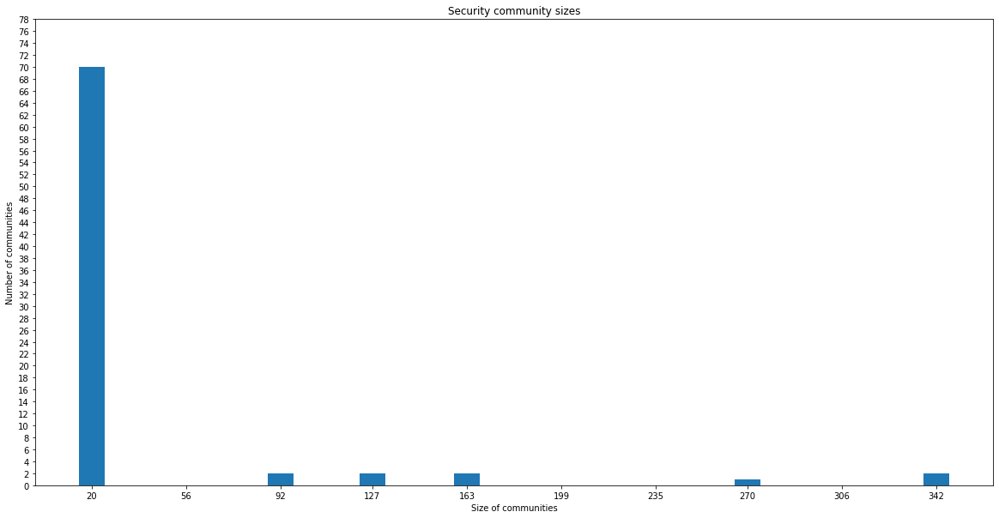

In [12]:
# Plot the community sizes and how many there are of that size.
hist, bin_edges = np.histogram(list(len(com) for com in security_communities.values()))
center = ((bin_edges[:-1] + bin_edges[1:]) / 2).round()
fig = plt.figure(figsize=(20, 10))
plt.bar(center, hist, width=10)
plt.title("Security community sizes")
plt.ylabel("Number of communities")
plt.xlabel("Size of communities")
plt.xticks(center)
plt.yticks(list(range(0, len(security_communities.values()), 2)))
fig.show()

Once again, this distribution follows a power law distribution as we have many small communities and few large ones. Furthermore, if we take the five largest communities and sum up the nodes, we can see that approxmately 64.49% of our nodes are within these communities.

The initial hypothesis that our security people were split in two can not be validated with the analysis done so far, as we have more than two communities within our network. To further analyze our Twitter sphere, we now move towards exploring the members of our communities, to see if the Twitter sphere is split in other ways.

#### Step 3.1 - Wordclouds

Now that we have established that our graph contain five large communities that include  64.49% of our nodes, we would like to explore these communities. As mentioned in the previous analysis step, we had a hypothesis that our Twitter sphere were divided into offensive and defensive security. As the analysis shown, our view of security people were far too simply. To explore the types of people in our communities we have decided to analyse the bios of ur community members.

The best way of getting an overview of a number of Twitter profiles is to look at their bio. A Twitter bio often explains what the person behind the profile is interested about. To do this for our communities we create a word cloud for each community. This is done by first analyzing the word frequency of all the individual communities bios. The frequency of words is then used to determine the size of the word in the word cloud. The higher the frequency the larger the word. Furthermore the Inverse Document Frequency is used in conjunction with the word frequency to filter out stop words from the wordclouds.

The result of this can be seen in the following word clouds. Communities are ordered by their size, so community one is the largest and five is the smallest (of the top five communities)

<!-- Here we apply the tool -->



In [13]:
# The top 5 largest communities. These will be used for further analysis.
top_5_largest_communites = sorted(security_communities.values(), key=len, reverse=True)[:5]

In [14]:
# Load in the Twitter information of a user such as their profile description (bio) and their location. 
with open("bios.csv", newline="") as f:
    csv_reader = csv.DictReader(f)
    user_info_by_name = {row["screen_name"]: (row["bio"], row["location"]) for row in csv_reader}

In [15]:
# Map the loaded Twitter infomation with the community they belong to.
# If some Twitter information can not be found, an empty bio and location.
# The communites are named from 0 to 4 where the 0 is the largest commuity 
# and 4 is the smallest of the top 5 largest communities.
user_info_by_community = {i: [user_info_by_name.get(name, ("", "")) for name in members] for i, members in enumerate(top_5_largest_communites)}

In [16]:
# All functions in this code cell is copied from our Assignment 2: 
# https://github.com/Glorforidor/SocialGraphAssignments/blob/master/Assignment2.ipynb
# easily viewed here:
# https://nbviewer.jupyter.org/github/Glorforidor/SocialGraphAssignments/blob/master/Assignment2.ipynb

def bag_of_words(document):
    """bag_of_words returns a list of tokens of the document."""
    tokenizer = nltk.RegexpTokenizer(r"[\w']+")
    tokens = tokenizer.tokenize(document)
    words = [w.lower() for w in tokens if w.isalpha()]
    
    wnl = nltk.WordNetLemmatizer()
    lemma = [wnl.lemmatize(w) for w in words]

    return lemma


def number_of_words(bag_of_words, unique_words):
    """number_of_words return a dict where the key is a word in the bag_of_words and value is the number of times it appears.

    The unique_words is all unique words in the corpus.
    """
    num_words = dict.fromkeys(unique_words, 0)
    for word in bag_of_words:
        num_words[word] += 1
    
    return collections.Counter(num_words)


def compute_TF(number_of_words, bag_of_words):
    """compute_TF returns the computed Term Frequency weight as a dict with words as keys and the weight as values."""
    tf_dict = collections.Counter()
    # bag_of_words_count = len(bag_of_words)
    for word, count in number_of_words.items():
        tf_dict[word] = count # / float(bag_of_words_count)  # without / float this function is the same as number_of_words = raw count
    return tf_dict


def compute_IDF(documents):
    """compute_IDF returns the computed Inverse Document Frequency weight as a dict with words as keys and the weight as values.
    
    Its weighting scheme: inverse document frequency log(N/nt)
    """
    N = len(documents)
    
    idf_dict = collections.Counter()
    for document in documents:
        for word, val in document.items():
            if val > 0:
                idf_dict[word] += 1
    
    for word, val in idf_dict.items():
        idf_dict[word] = math.log10(N / float(val))
    
    return idf_dict


def compute_TFIDF(tfs, idfs):
    """compute_TFIDF returns the computer Term Frequency - Inverse Document Frequency weight as a dict of words as keys and weight as values."""
    tf_idf = collections.Counter()
    for word, val in tfs.items():
        tf_idf[word] = val * idfs[word]
    return tf_idf

In [17]:
# Collect all bios and locations of users within each community.
# The collected bios and locations will each be concatenated into one long text - a document.
# Each community will then have one document of bios and one of locations.
list_bios = []
list_locations = []
for user_info in user_info_by_community.values():
    list_bios.append(bag_of_words(" ".join(bios for bios, __ in user_info)))
    list_locations.append(bag_of_words(" ".join(location for __, location in user_info)))


# Get all the unique words from the user bios across all documents.
unique_words = {word for bag in list_bios for word in bag}

In [18]:
# Calculate the Term Frequency for all documents.
tfs = []
for bag in list_bios:
    n = number_of_words(bag, unique_words)
    tfs.append(compute_TF(n, bag))

In [19]:
# Calculate the Inverse Document Frequency for all the documents in the corpus.
idfs = compute_IDF(tfs)

In [20]:
# Calculate the Term Frequency - Inverse Document Frequency weight for each document in the corpus.
tfidfs = []
for tf in tfs:
    tfidfs.append(compute_TFIDF(tf, idfs))

In [21]:
# Create a WordCloud instance and limit words shown on the cloud to 100.
# By limiting to 100 we can filter out less important words and hightlight 
# the most used words more.
wordcloud = WordCloud(
    width=800,
    height=400,
    max_words=100,
    collocations=False,
)

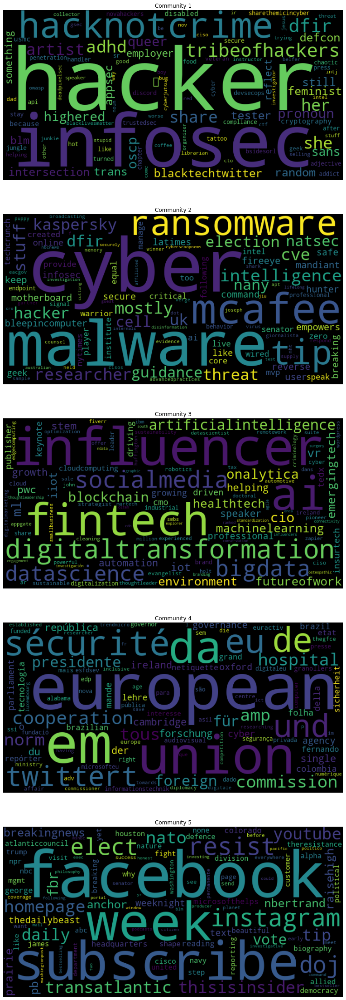

In [22]:
# Plot the community members bios as a wordcloud.
# We show the community name to be n+1 as non tech people still seems to index from 1.. :O
fig, axs = plt.subplots(nrows=len(tfidfs), ncols=1, figsize=(40,40))
for i, tfidf in enumerate(tfidfs):
    wordcloud.generate_from_frequencies(tfidf)
    axs[i].set_title(f"Community {i+1}")
    axs[i].imshow(wordcloud, interpolation="bilinear")
    axs[i].axis("off")


fig.show()

##### Community 1
The word cloud contains words such as hacker, infosec, queer, blacktechtwitter, pronoun, hacknotcrime, adhd, artist and more.
This suggests that this community is centered mainly around hacker and infosec. Furthermore it seems that many members of this community cares about their identity and social issues such as racism.

##### Community 2
The word cloud contains words such as mcafeee, malware, ransomware, cyber, kaspersky, threat, cve, intelligence, etc.
This suggests that this community is centered around anti virus and malware research.

##### Community 3
The word cloud contains words such as blockchain, socialmedia, influencer, ai, datascience, bigdata, digitaltransformation, etc.
This suggests that this community is centered around more "soft" security related topics. Most of the words in this word cloud are new terms and technologies such as blockchain, influencer, fintech and bigdata.

##### Community 4
The word cloud contains words such as words european, union, sécurité, ireland, governance, etc.
This suggests that this community is centered around security related to europe and the european union. The word cloud also has non-english words, suggesting that this community consists of non-native english speakers.

##### Community 5
The word cloud contains words such as facebook, resist, subscribe, youtube, instagram, daily, etc.
This suggests that this community is centered around social media and news related topics. This could very likely be Twitter profiles belonging to news sites that write about cyber security.

#### Step 3.2 - Word cloud for location

The word cloud analysis of our communities showed that there are different communities within our Twitter sphere. Twitter is a global social network, and we therefore want to examine the location of these communities, to see if security people are also spread around the globe. We decided to include this analysis in our final project, as the fourth community was centered around the European Union. Therefore we found it interesting to examine whether or not this was related to the location of the tweeters.

Once again we utilize word clouds to find the most frequent locations and match this with the information found in the previous analysis on what these security people write in their bio.

In [23]:
# Get the frequency of user locations.
# This will be used to create wordclouds of user locations.
unique_locations = {word for bag in list_locations for word in bag}
location_tfs = []
for bag in list_locations:
    n = number_of_words(bag, unique_locations)
    location_tfs.append(compute_TF(n, bag))

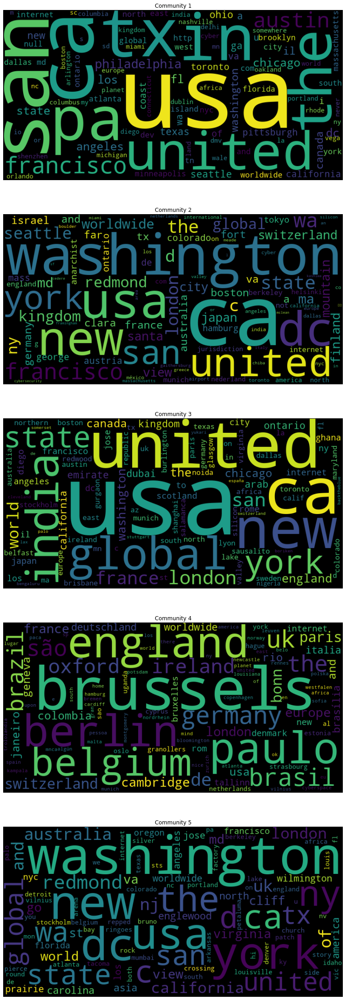

In [24]:
# Plot the community members location as a wordcloud.
# We show the community name to be n+1 as non tech people still seems to index from 1.. :O
fig, axs = plt.subplots(nrows=len(location_tfs), ncols=1, figsize=(40,40))
for i, tf in enumerate(location_tfs):
    wordcloud.generate_from_frequencies(tf)
    axs[i].set_title(f"Community {i+1}")
    axs[i].imshow(wordcloud, interpolation="bilinear")
    axs[i].axis("off")


fig.show()

As it can be seen in the word clouds, community 1, 2, 3 and 5 are primarily dominated by american residents. But community 4, that we previously discovered were dominated by words related to the European Union, is filled primarily with locations from Europe. These are locations such as Brussels, Belgium, England and Germany, and therefore supports our theory that this community is located within Europe. Certain words related to Brazil can also be found, though we are unsure why.

#### Step 3.3 - Sentiment of communities

The communities we found previously in this notebook are very different from each other, even though all the Twitter profiles are within the cyber security domain. In the beginning of the project we were interested in knowing if security people were split in two communities, an offensive and defensive. And with this split of communities, we wanted to know if they were equally happy. The analysis of communities showed that we in fact had more communities, and that they were not divided as we thought. With this said, it is still very interesting to analyze how happy the individual communities are.  

To describe the happiness of each community, we fetch the latest 20 tweets for each of the profiles in the communities. Using the results from the paper "Temporal Patterns of Happiness and Information in a Global Social Network: Hedonometrics and Twitter" [3], we extract known words from tweets and apply a sentiment value to each. We then find the average sentiment value for each community and compare these results to each other

In [25]:
# Download the dataset with happiness average.
url = "https://ndownloader.figstatic.com/files/360592"
words_of_happiness = pd.read_csv(url, delimiter="\t", skiprows=3)

The above dataset comes from this paper: Temporal Patterns of Happiness and Information in a Global Social Network: Hedonometrics and Twitter[4]

In [26]:
# This lovely code is from our Assignment 2:
# https://github.com/Glorforidor/SocialGraphAssignments/blob/master/Assignment2.ipynb
# easily viewed here:
# https://nbviewer.jupyter.org/github/Glorforidor/SocialGraphAssignments/blob/master/Assignment2.ipynb

def compute_average_sentiment(tokens):
    """compute_average_sentiment returns the average sentiment value of the tokens.
    
    Each token in tokens must be in lowercase.
    """
    sentiment = 0.0
    if not len(tokens):
        return sentiment

    avg = np.nan_to_num(words_of_happiness[words_of_happiness["word"].isin(tokens)]["happiness_average"].mean())
    return avg

In [27]:
# Make a set of community members and assign them to the community by a number.
# The set will give us constant search time.
communities = {i: set(members) for i, members in enumerate(top_5_largest_communites)}

In [28]:
text_of_communities = collections.defaultdict(str)

In [29]:
# Load in tweets of all community members' timeline.
# The members' tweets of a community are combined into one document 
# and attach to that community.
# These documents will be used to calculate the sentiment value of each community.
with open("sentiment_tweets.csv", newline="") as f:
    csv_reader = csv.DictReader(f)
    for row in csv_reader:
        for i, members in communities.items():
            if row["screen_name"] in members:
                text_of_communities[i] += f" {row['tweets']}"

In [30]:
# Calculate the average sentiment value for each community.
sentiment_of_communities = {k: compute_average_sentiment(bag_of_words(v)) for k, v in text_of_communities.items()}

In [31]:
# Show the sentiment values for each community.
table = texttable.Texttable()
table.set_cols_align(["l", "r"])
table.set_cols_valign(["t", "b"])
table.set_precision(2)
table.add_row(["Community", "Sentiment value"])

for com, sentiment in sorted(sentiment_of_communities.items()):
    table.add_row([com+1, sentiment])

print(table.draw())

+-----------+-----------------+
| Community | Sentiment value |
+-----------+-----------------+
| 1         |            5.46 |
+-----------+-----------------+
| 2         |            5.44 |
+-----------+-----------------+
| 3         |            5.52 |
+-----------+-----------------+
| 4         |            5.51 |
+-----------+-----------------+
| 5         |            5.46 |
+-----------+-----------------+


Surprisingly, the results show no significant variance in the sentiment value of our communities. They all have a sentiment value between 5.42 and 5.52 which is a very neutral sentiment value.

## Discussion
This project was conceived with the belief that the cyber security twitter sphere consisted primarily of offensive and defensive Twitter profiles. This turned out to be a very simplified version of the actual world, where we discovered that a lot of communities exist within our Twitter sphere. While the most popular Twitter profiles were well-known, the word cloud analysis discovered more diverse communities than we initially thought existed. However, the project clearly shows that Twitter communities exist, and interestingly enough, most communities consist of profiles located in USA.

With this said, the sentiment analysis did not show a significant variance between communities, and this is something that could be looked further into. Maybe more data could be included into this, including data such as replies, GIF reactions and simply more tweets. The sentiment analysis also excluded tweets written in a language other than english, as the dataset we used to compare sentiment only contained english words. Approximately 15% of tweets were not in english.

At last, maybe a larger dataset of more tweets and search words could be used to further expand upon the Twitter cyber security world to see if more communities can be discovered. As the entire dataset is gathered from the initial 3546, a larger initial dataset could reveal entirely different communities and a broader network.

## Contribution

In the following table we put in the main and secondary contributor for each part of the project.

| Section                       | Main Contributor   | Secondary Contributor |
|:------------------------------|:------------------:|----------------------:|
| Data Scraping                 | Peter Bom Jakobsen | Yucheng Ren           |
| Network                       | Søren Fritzbøger   | Peter Bom Jakobsen    |
| Community                     | Yucheng Ren        | Søren Fritzbøger      |  
| Sentiment                     | Peter Bom Jakobsen | Yucheng Ren           |
| Visualization                 | Søren Fritzbøger   | Peter Bom Jakobsen    |
| Web page                      | Yucheng Ren        | Søren Fritzbøger      |

## References
[1] https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0098679#s1

[2] https://www.trustedsec.com/

[3] https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0026752#s4


[4] https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0026752#s4